In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import math
import os
import pickle
import copy

In [ ]:
def dist(p1, p2):
	return math.sqrt((p1[0]-p2[0])**2 + (p1[1]-p2[1])**2)
def getAngle(p0, p1, p2):
	return math.acos((dist(p0, p1)**2 + dist(p0, p2)**2 - dist(p1, p2)**2)/(2*(dist(p0, p1)**2)*(dist(p0, p2)**2)))

def getNormalisedCoordinates(x, y, brightest_index, second_brightest_index, lines=[]):

	x = copy.deepcopy(x)
	y = copy.deepcopy(y)

	lines = np.array(lines)

	for line in lines:
		for x1,y1,x2,y2 in line:
			x1 -= x[brightest_index]
			y1 -= y[brightest_index]
			x2 -= x[brightest_index]
			y2 -= y[brightest_index]
			line[0][0] = x1
			line[0][1] = y1
			line[0][2] = x2
			line[0][3] = y2


	for i in range(len(x)):
		x[len(x)-i-1] -= x[brightest_index]
		y[len(x)-i-1] -= y[brightest_index]


	distance_brightest = math.sqrt((x[brightest_index]-x[second_brightest_index])**2 + (y[brightest_index]-y[second_brightest_index])**2)


	for i in range(len(x)):
		x[i] = x[i]/distance_brightest
		y[i] = y[i]/distance_brightest
	lines = lines/distance_brightest

	p0 = (x[brightest_index], y[brightest_index])
	p1 = (x[second_brightest_index], y[second_brightest_index])
	p2 = (1, 0)
	theta = getAngle(p0, p1, p2)
	if round(x[second_brightest_index]*math.cos(theta) - y[second_brightest_index]*math.sin(theta), 2) != float(1) or round(x[second_brightest_index]*math.sin(theta) + y[second_brightest_index]*math.cos(theta), 2) != float(0):
		theta = -theta


	for i in range(1, len(x)):
		x_new = x[i]*math.cos(theta) - y[i]*math.sin(theta)
		y_new = x[i]*math.sin(theta) + y[i]*math.cos(theta)
		x[i], y[i] = round(x_new, 2), round(y_new, 2)

	for line in lines:
		for x1,y1,x2,y2 in line:
			x1_new = x1*math.cos(theta) - y1*math.sin(theta)
			y1_new = x1*math.sin(theta) + y1*math.cos(theta)
			x2_new = x2*math.cos(theta) - y2*math.sin(theta)
			y2_new = x2*math.sin(theta) + y2*math.cos(theta)
			line[0][0] = x1_new
			line[0][1] = y1_new
			line[0][2] = x2_new
			line[0][3] = y2_new

	return np.array(x), np.array(y), lines

In [ ]:
def iterateArea(contours, lines=[], iterate=False):

	lines = np.array(lines)


	coordinates = {}
	for i in range(len(contours)):
		cnt = contours[i]
		M = cv2.moments(cnt)

		cx = int(M['m10']/M['m00'])
		cy = int(M['m01']/M['m00'])
		area = cv2.contourArea(cnt)
		if area in coordinates:
			coordinates[area+0.0001] = (cx, cy)
		else:
			coordinates[area] = (cx, cy)

	sorted_area = []
	for i in reversed(sorted(coordinates.keys())):
		sorted_area.append(i)


	x = []
	y = []
	for area in sorted_area:
		x.append(coordinates[area][0])
		y.append(coordinates[area][1])

	threshold = min(150 , sorted_area[2])

	count = 0
	for area in sorted_area:
		if area >= threshold:
			count += 1

	coordinates_list = []

	if iterate == False:
		return getNormalisedCoordinates(x, y, 0, 1, lines)
	else:
		for i in range(count):
			for j in range(i+1, count):
				x_new, y_new, _ = getNormalisedCoordinates(x[i:], y[i:], i, j, lines)
				coordinates_list.append((x_new, y_new))

		return coordinates_list


def findEdges(image, thresh1, thresh2):
	out = cv2.Canny(np.array(image), thresh1, thresh2)
	return out

def invertImage(image):
	return cv2.bitwise_not(image)


def getGrayscale(image):
	return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

In [ ]:

def applyMedian(image, size):
	return cv2.medianBlur(image, size)

def plotImage(image, imagename="figure"):
	cv2.imshow(imagename, image)

def binariseImage(img, thresholds):

	output_thresh = []
	for threshold in thresholds:
		ret,thresh = cv2.threshold(img,threshold,255,cv2.THRESH_BINARY)
		output_thresh.append(thresh)

	return output_thresh

def getGreenChannel(img):

	image_copy_green = img.copy()

	image_copy_green[:, :, 0] = 0
	image_copy_green[:, :, 2] = 0
	return image_copy_green

def getBlueChannel(img):

	image_copy_blue = img.copy()

	image_copy_blue[:, :, 1] = 0
	image_copy_blue[:, :, 2] = 0
	return image_copy_blue

def getRedChannel(img):


	image_copy = img.copy()
	image_copy[:, :, 1] = 0
	image_copy[:, :, 0] = 0
	return image_copy

def makeTemplates():


	template_directory = "./Templates"
	templates_coordinates = {}

	# Iterate through each file in the template directory to process one template at a time
	for filename in os.listdir(template_directory):
	# for filename in ["Hercules.png"]:
		# print(filename)

		# Reading the template
		img = cv2.imread("./Templates/" + filename)
		# cv2.imshow('original' ,img)
		red_channel = getRedChannel(img)
		# plotImage(red_channel, "red")
		thresh = binariseImage(red_channel, [165.75, 191.25])

		blue_channel = getBlueChannel(img)

		thresh2 = binariseImage(red_channel, [125.75, 255])
		letters = thresh2[0] - thresh2[1]
		new_blue = blue_channel + letters

		for i in range(len(new_blue)):
			for j in range(len(new_blue[i])):
				if new_blue[i][j][2] != 0:
					new_blue[i][j][1] = 0
					new_blue[i][j][0] = 0
					new_blue[i][j][2] = 0

		# Subtracting to get only stars
		final = thresh[0] - thresh[1]
		# plotImage(final, "final")

		stars = applyMedian(final, 3)
		lines = applyMedian(new_blue, 3)

		stars_grey = getGrayscale(stars)
		lines_grey = getGrayscale(lines)
		final_stars = binariseImage(stars_grey, [20])
		final_lines = binariseImage(lines_grey, [5])
		final_stars_inverted = invertImage(final_stars[0])
		final_lines_inverted = invertImage(final_lines[0])
		final_lines = applyMedian(final_lines[0], 3)

		edged = findEdges(final_stars_inverted, 30, 200)
		# plotImage(edged, "edges")
		# cv2.waitKey(0)

		rho = 1  # distance resolution in pixels of the Hough grid
		theta = np.pi / 180  # angular resolution in radians of the Hough grid
		threshold = 10  # minimum number of votes (intersections in Hough grid cell)
		min_line_length = 2  # minimum number of pixels making up a line
		max_line_gap = 3  # maximum gap in pixels between connectable line segments
		line_image = np.copy(img) * 0  # creating a blank to draw lines on

		# Run Hough on edge detected image
		# Output "lines" is an array containing endpoints of detected line segments
		drawn_lines = cv2.HoughLinesP(final_lines, rho, theta, threshold, np.array([]), min_line_length, max_line_gap)
		# drawn_lines = drawn_lines[1:]
		for line in drawn_lines:
			for x1,y1,x2,y2 in line:
				cv2.line(line_image,(x1,y1),(x2,y2),(255,0,0),5)
		# cv2.imshow("drawn", line_image)
		# cv2.waitKey(0)

		# Finding the contours in the image
		edge_copy = edged.copy()
		contours, hierarchy = cv2.findContours(edge_copy, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

		final_contours = []
		for contour in contours:
			area = cv2.contourArea(contour)
			if area != 0:
				final_contours.append(contour)

		# print("Number of Contours found = " + str(len(final_contours)))
		# cv2.drawContours(img, contours, -1, (0, 255, 0), 3)
		# cv2.imshow('Contours', img)
		# cv2.waitKey(0)
		# cv2.destroyAllWindows()

		x, y, normalised_lines = iterateArea(final_contours, drawn_lines)

		templates_coordinates[filename[:-4]] = (x, y, len(final_contours) , normalised_lines)

		# Plot the normalised stars or save them
		plt.figure("Normalised " + filename[:-4] + " stars")
		plt.scatter(x, y)
		for line in normalised_lines:
			for x1,y1,x2,y2 in line:
				plt.plot([x1, x2], [y1, y2], color='red')

		# plt.savefig("./Normalised_Templates/" + filename)
		# plt.close()
		# plt.show()

		# Return the normalised coordinates
		# return x, y

	# Save the normalised coordinates for all templates
	with open("Template Coordinates", "wb") as fp:
		pickle.dump(templates_coordinates, fp)



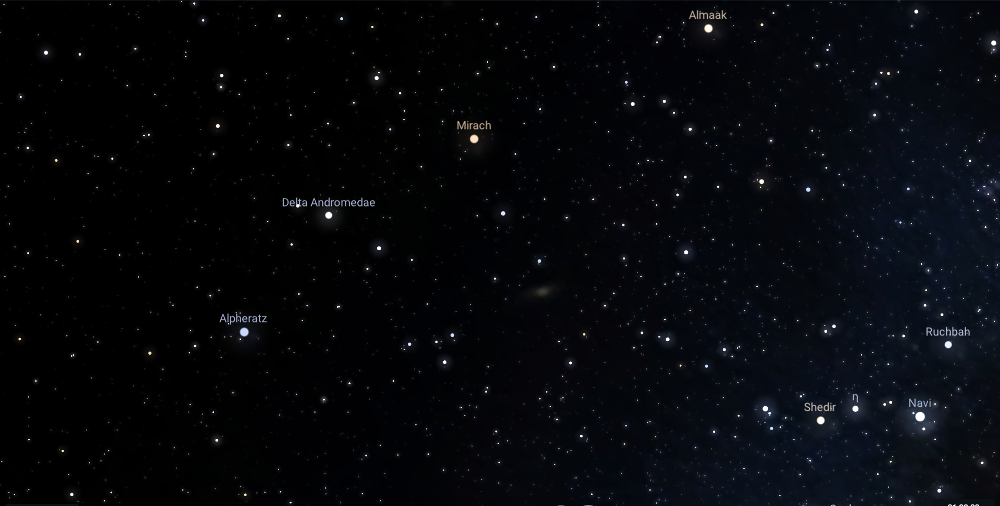

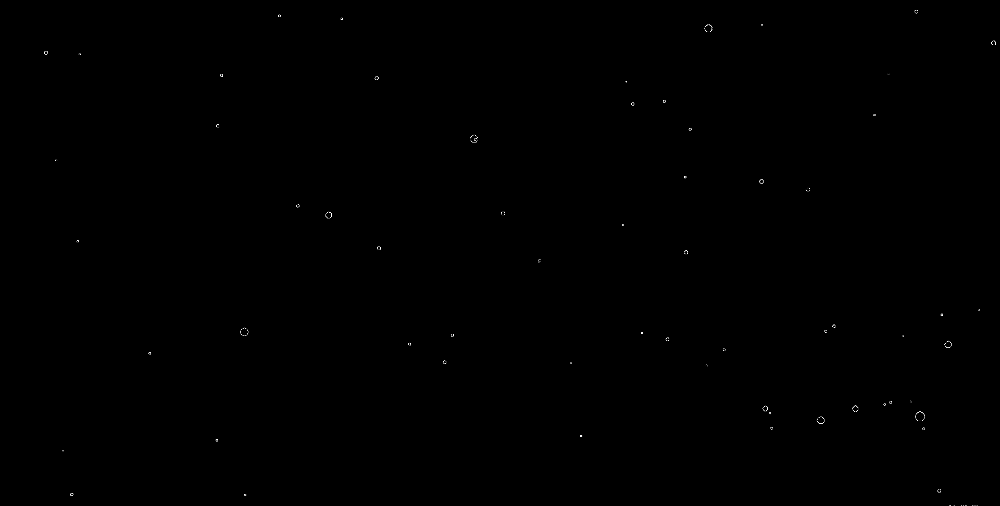

Andromeda UrsaMinor


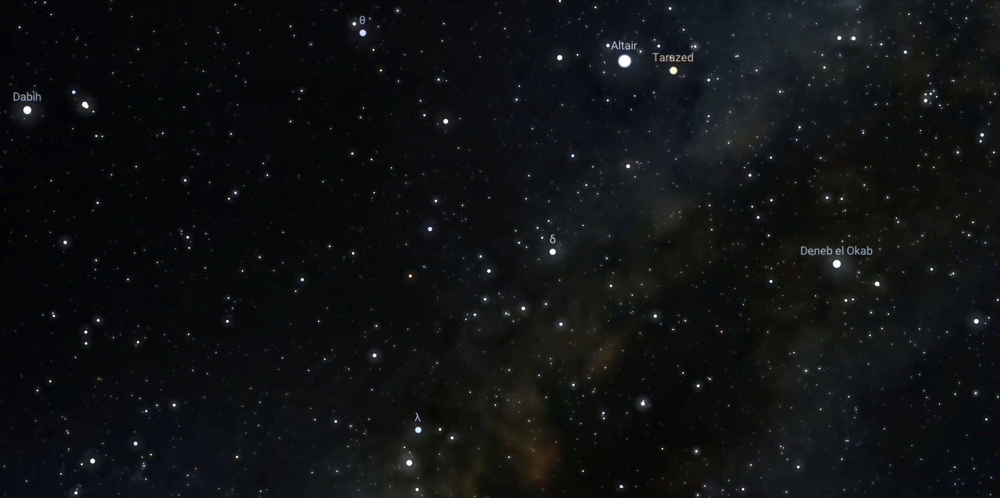

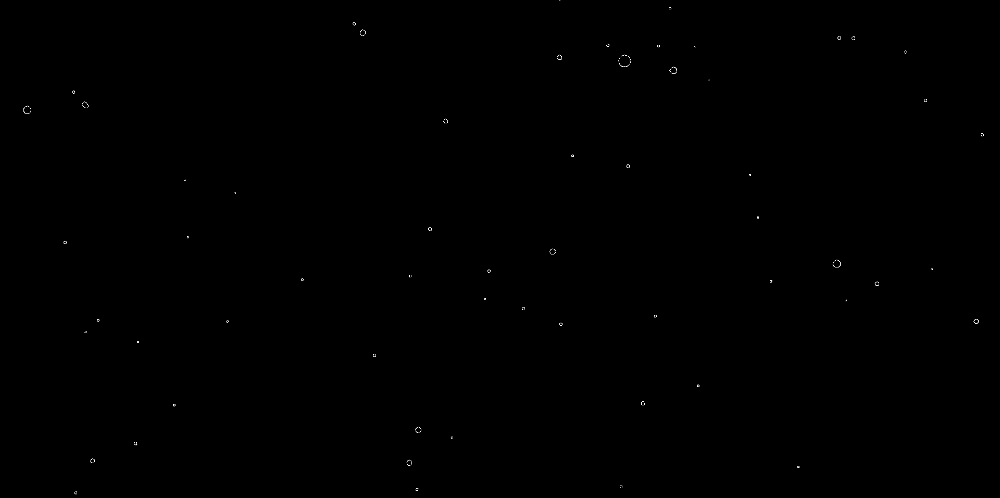

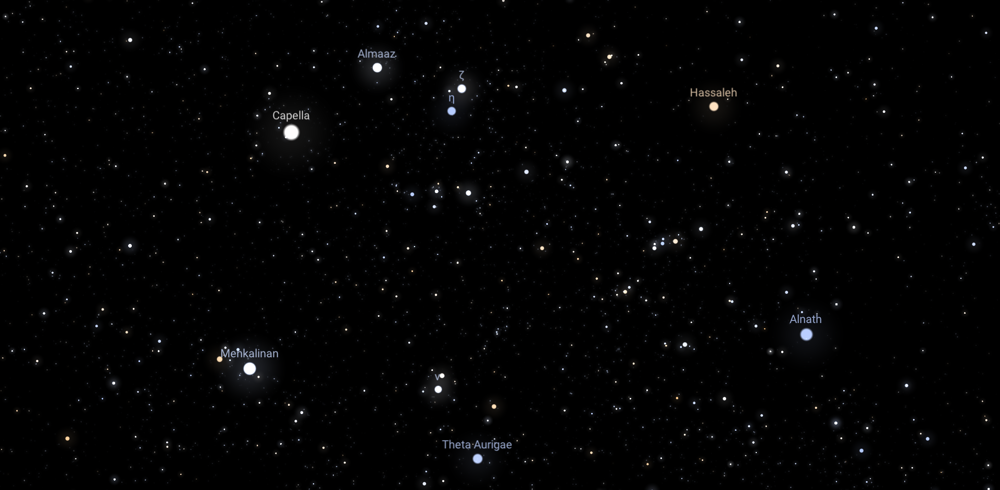

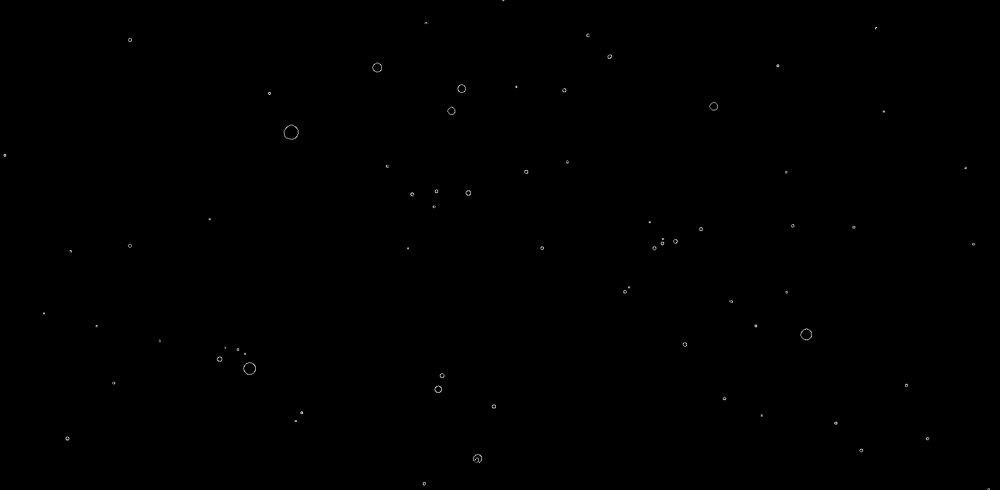

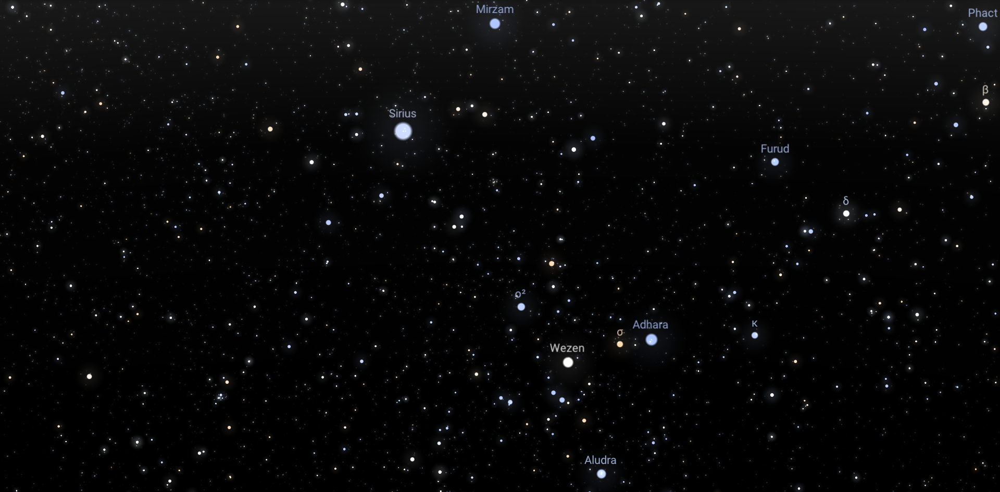

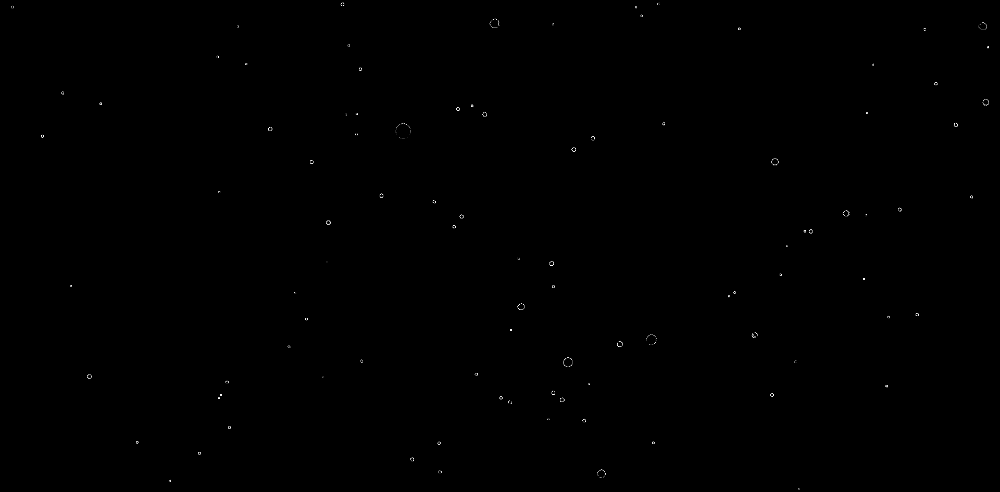

CanisMajor Taurus


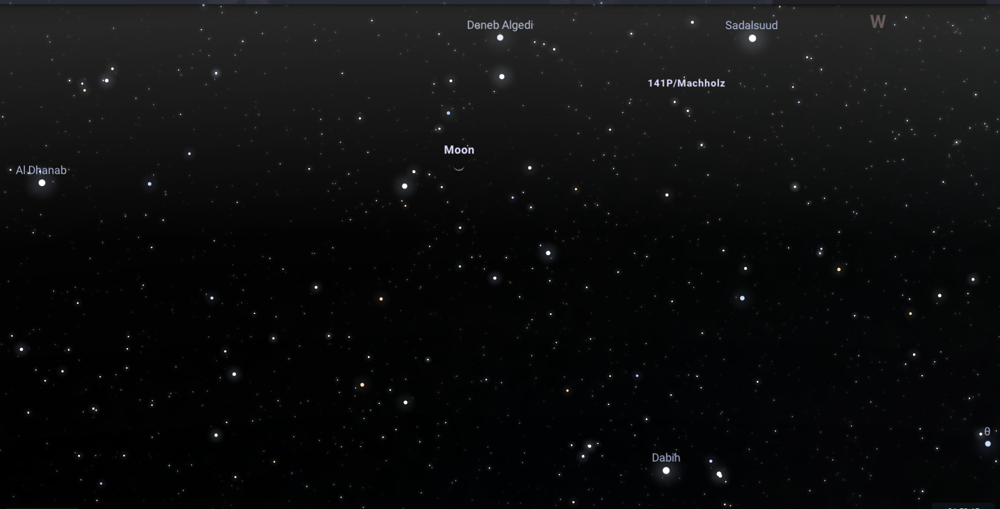

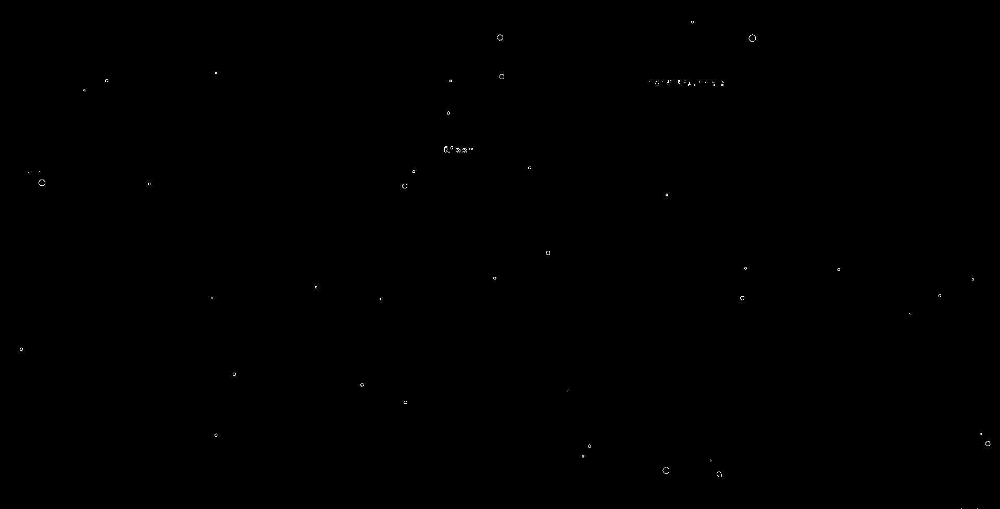

Capricornus Phoenix


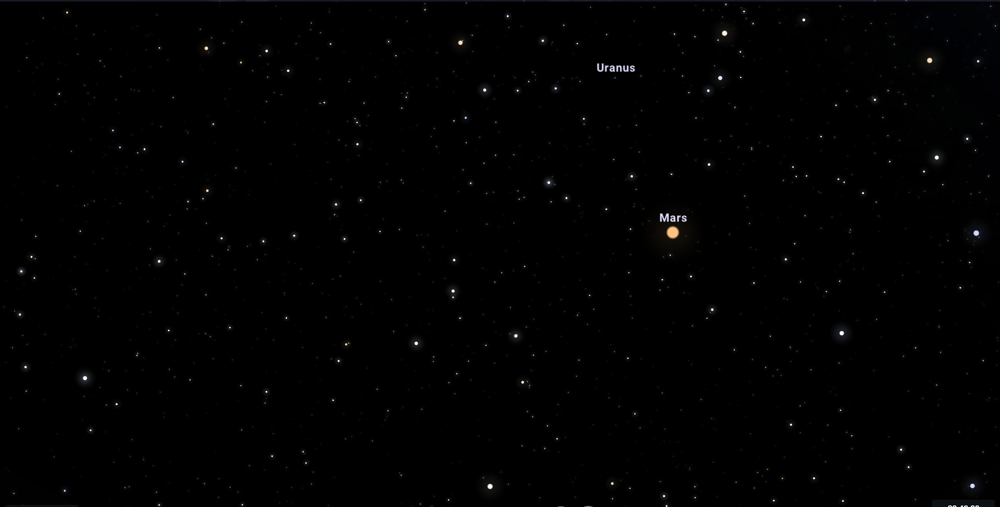

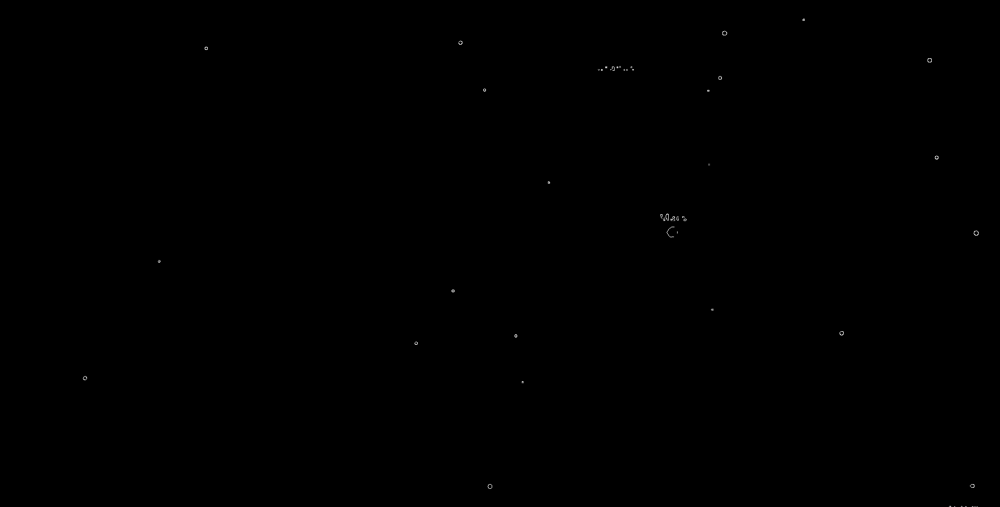

Cetus Columba


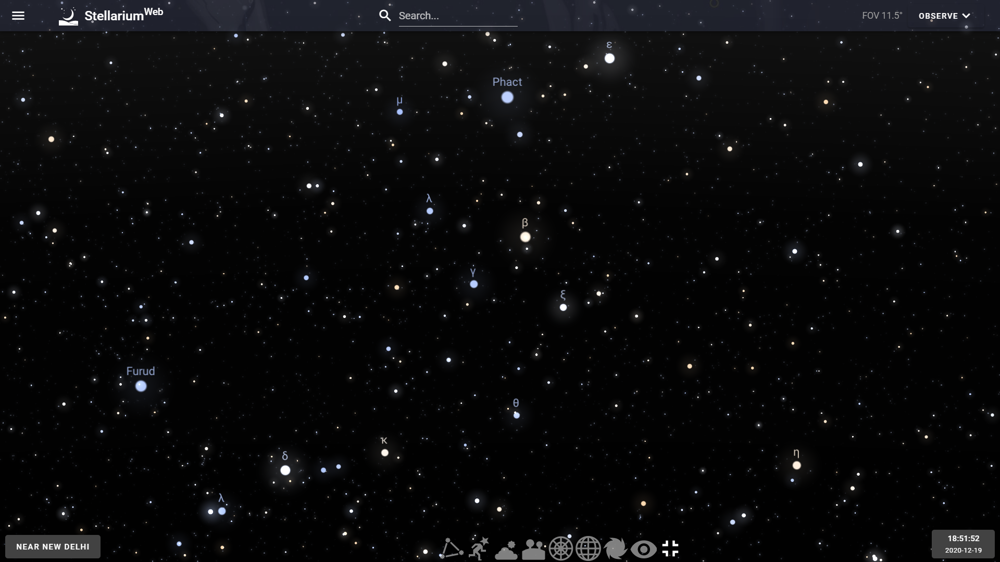

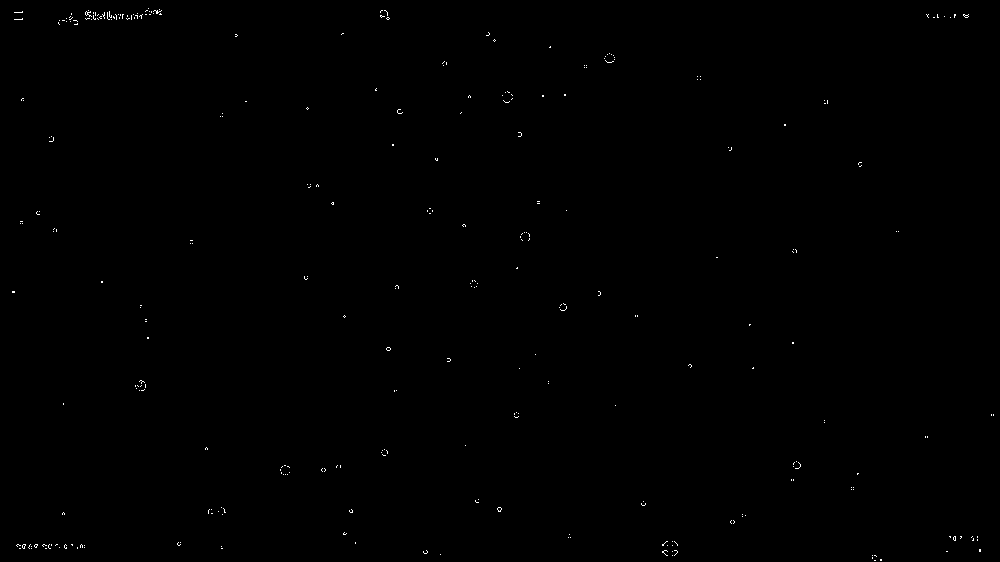

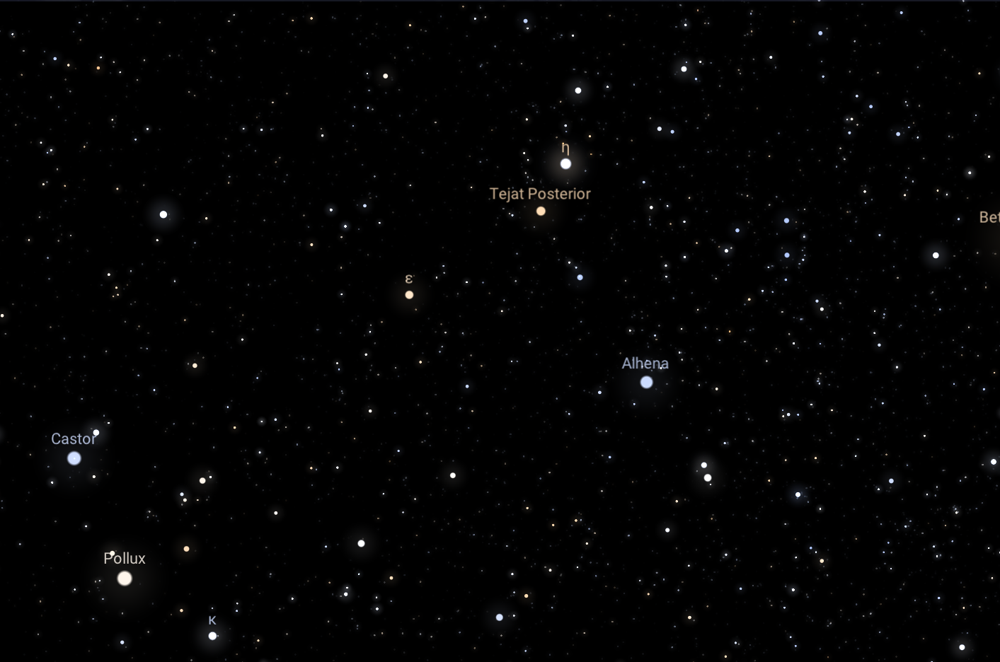

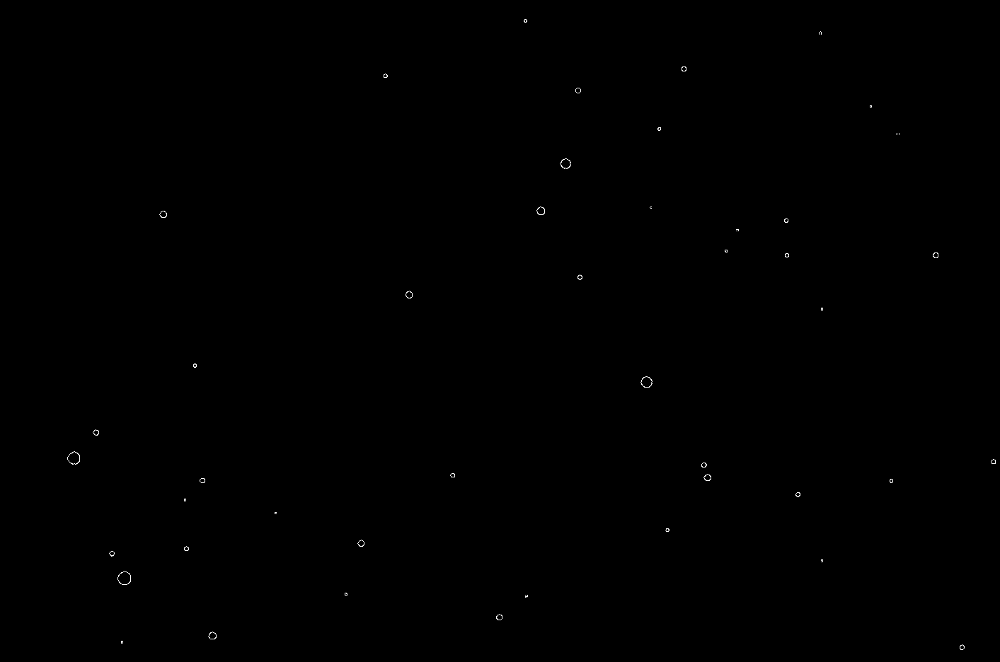

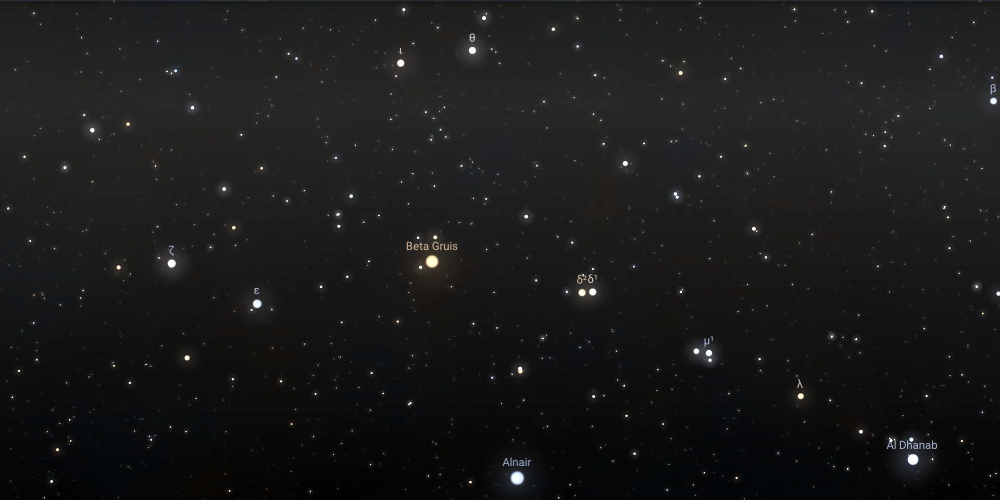

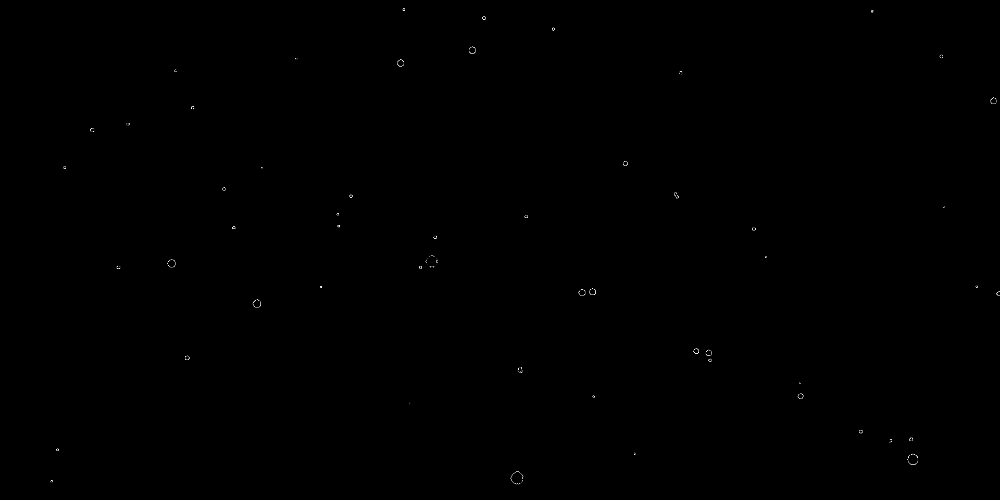

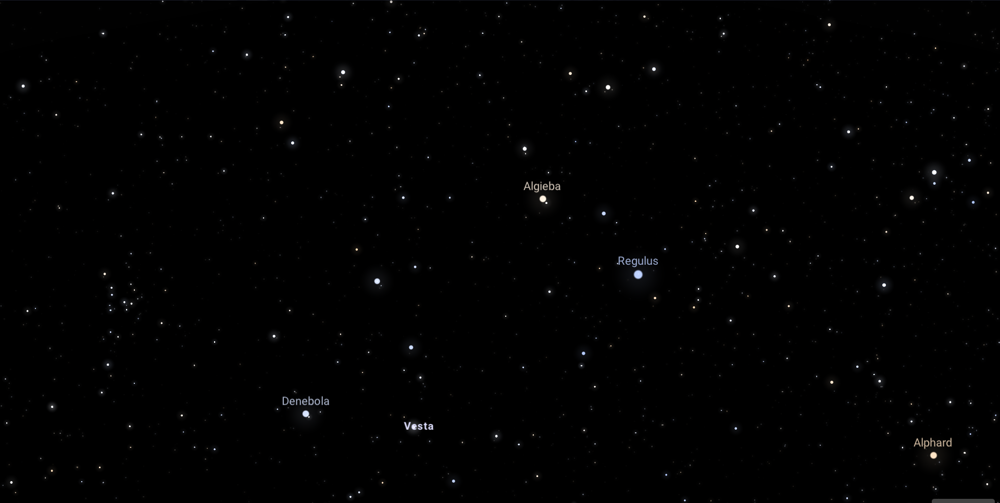

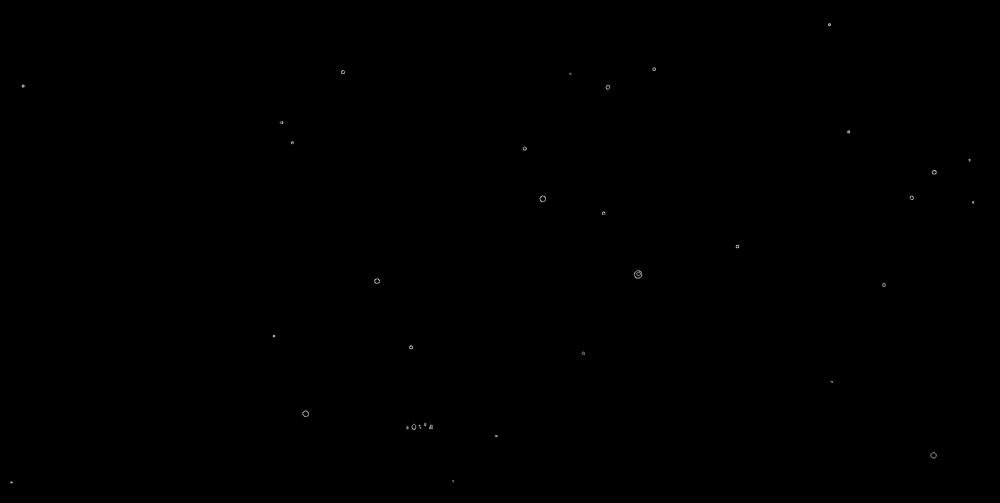

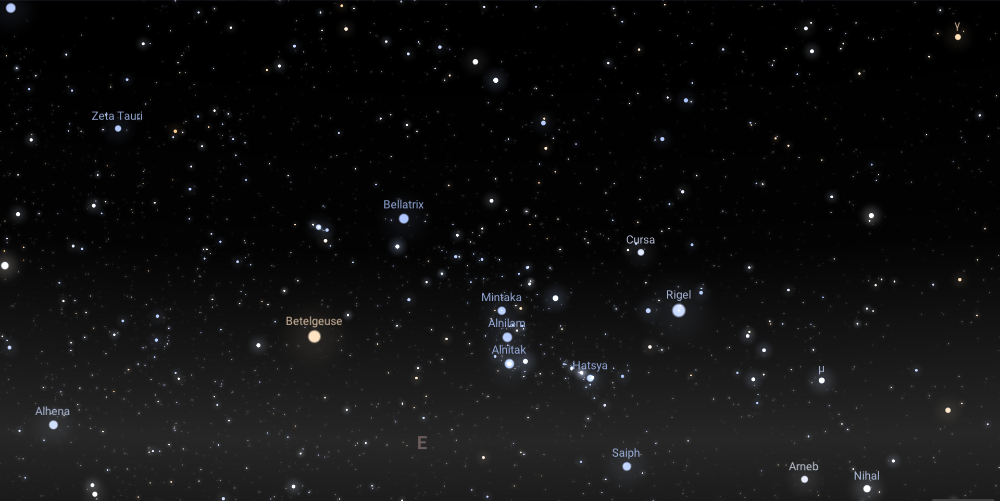

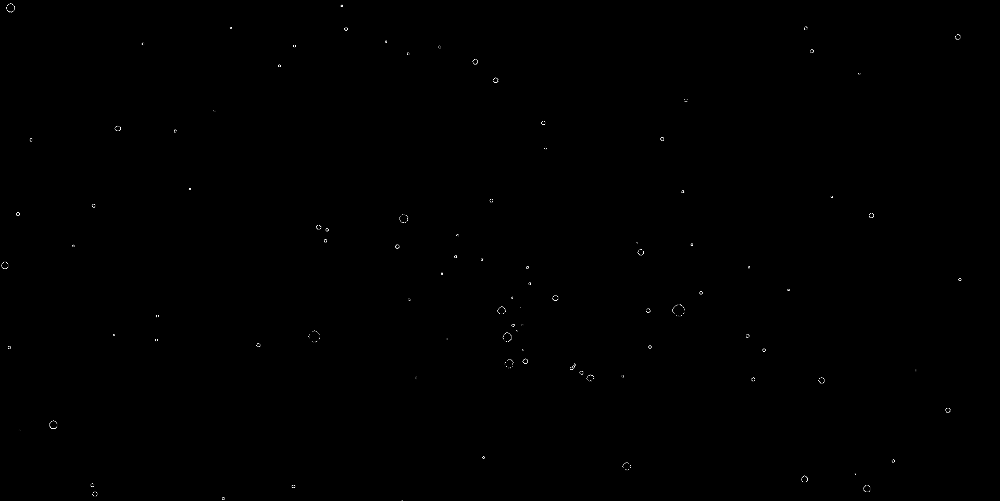

Orion UrsaMinor


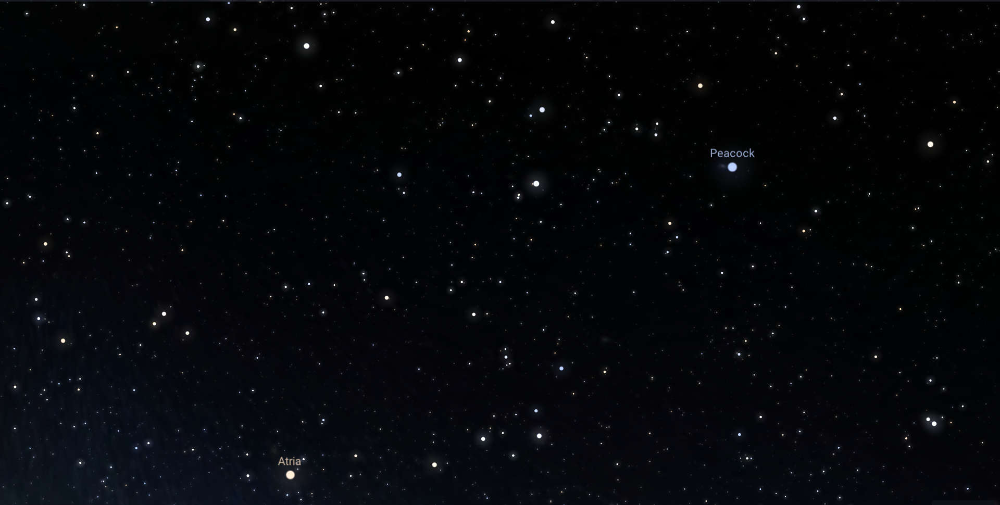

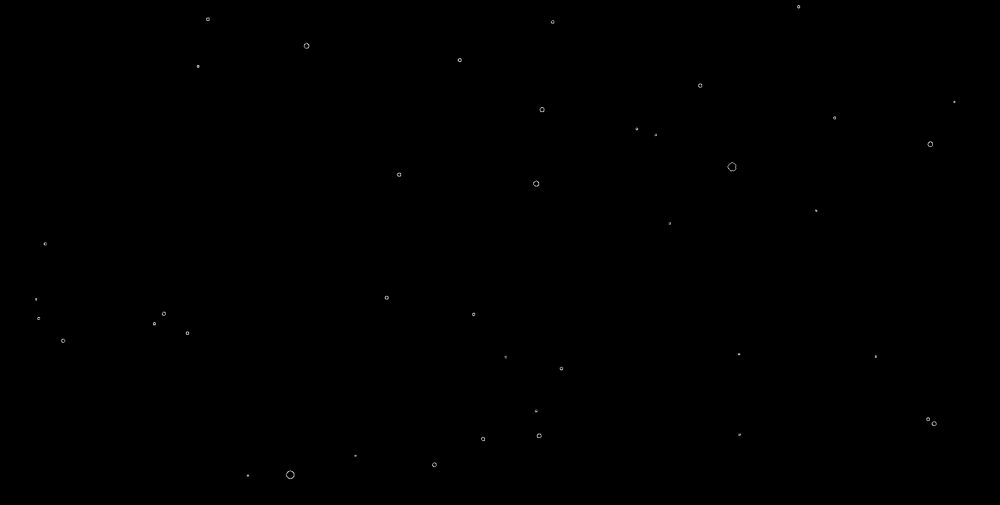

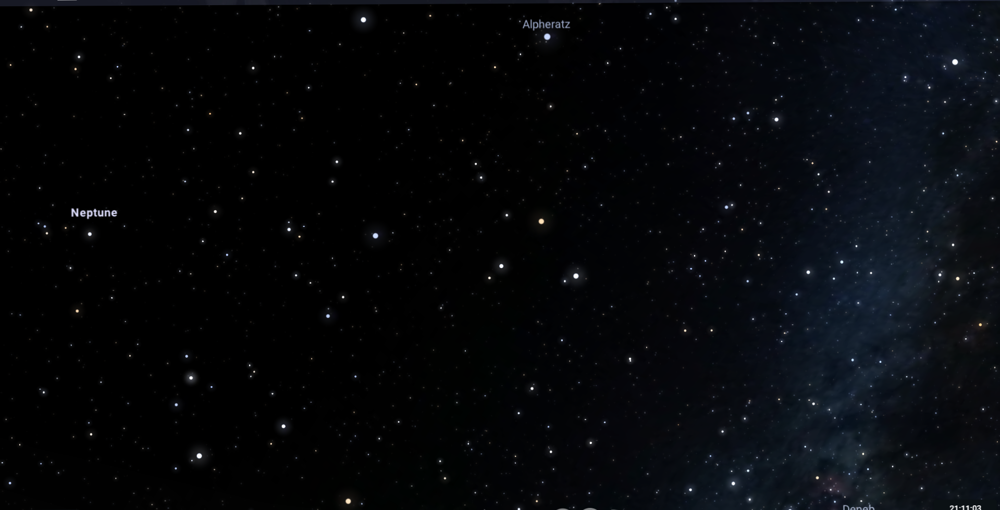

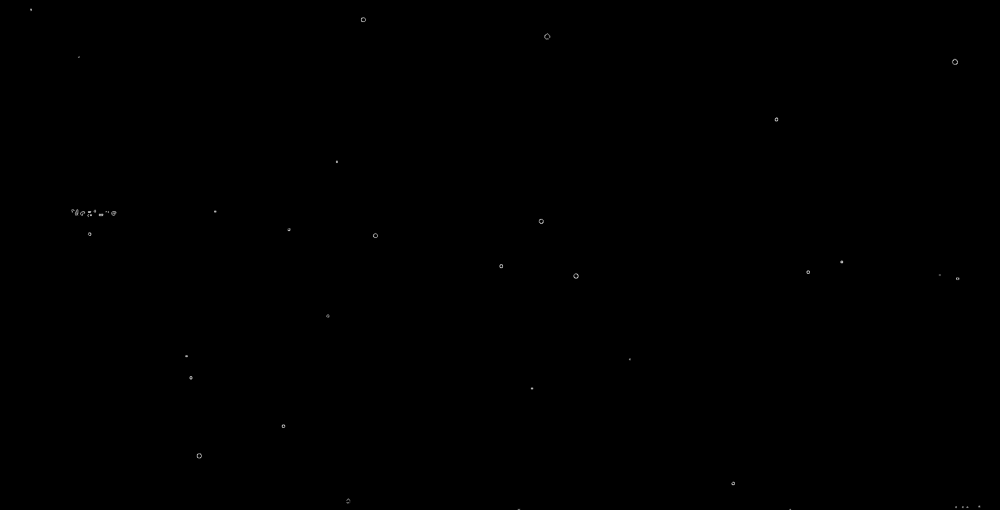

Pegasus Auriga


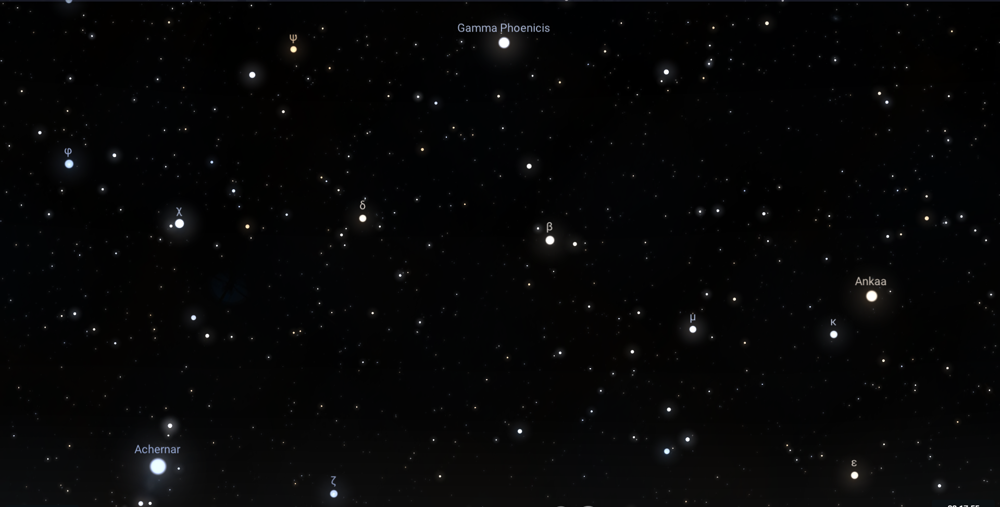

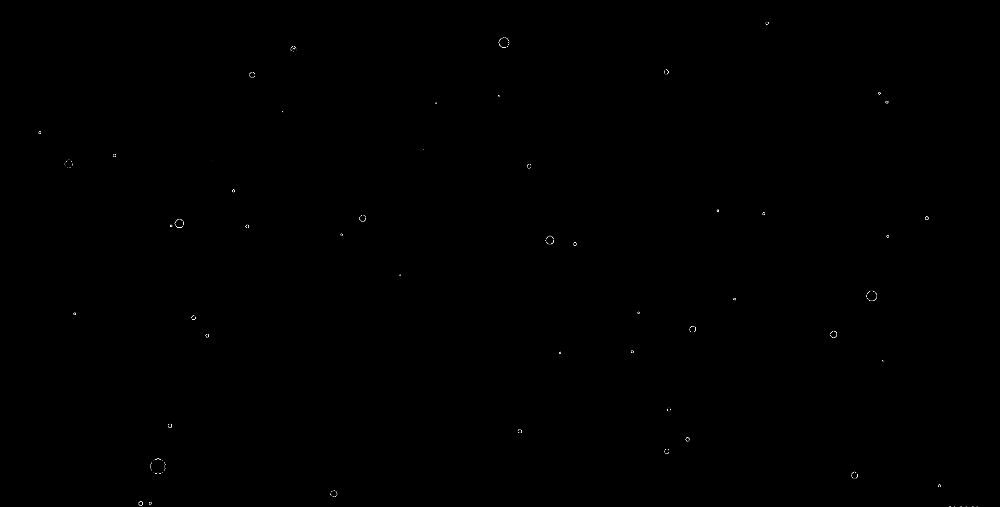

Phoenix Grus


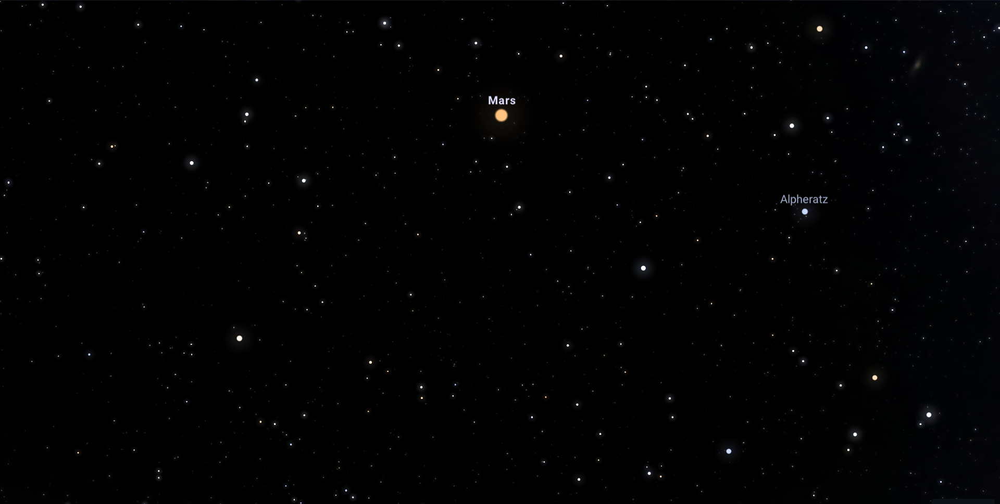

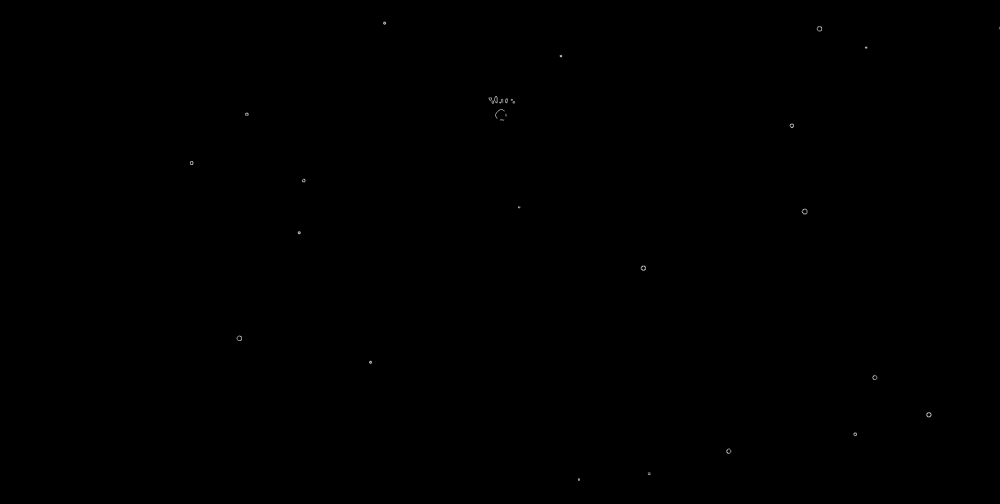

Pisces Columba


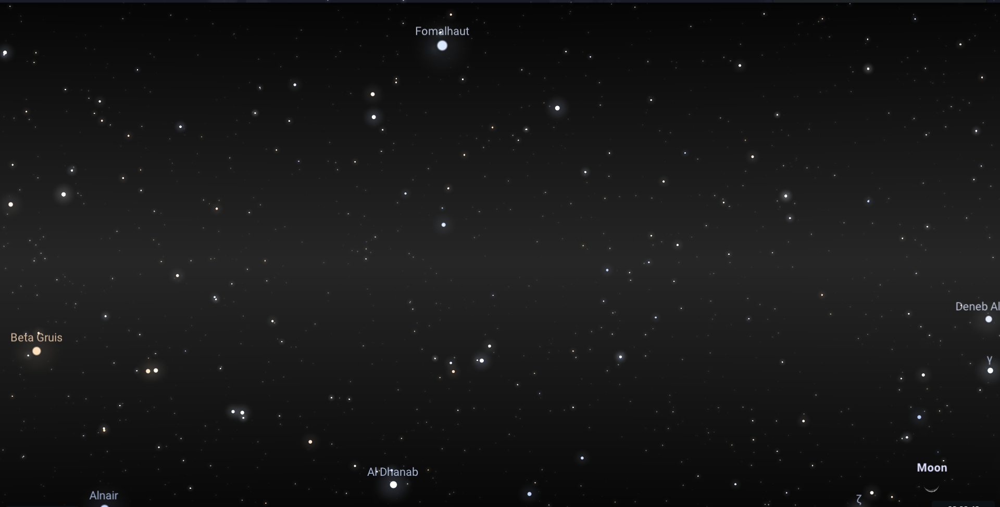

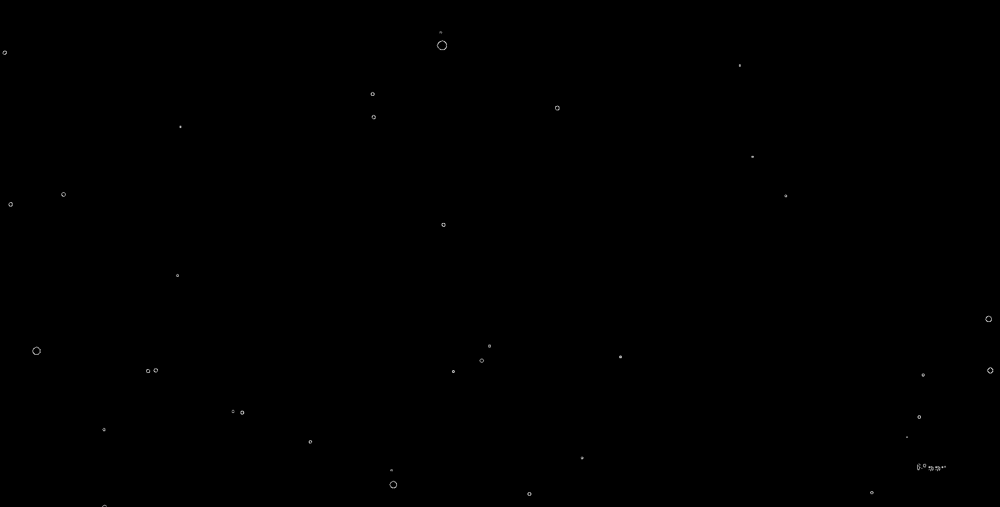

PiscisAustrinus Cetus


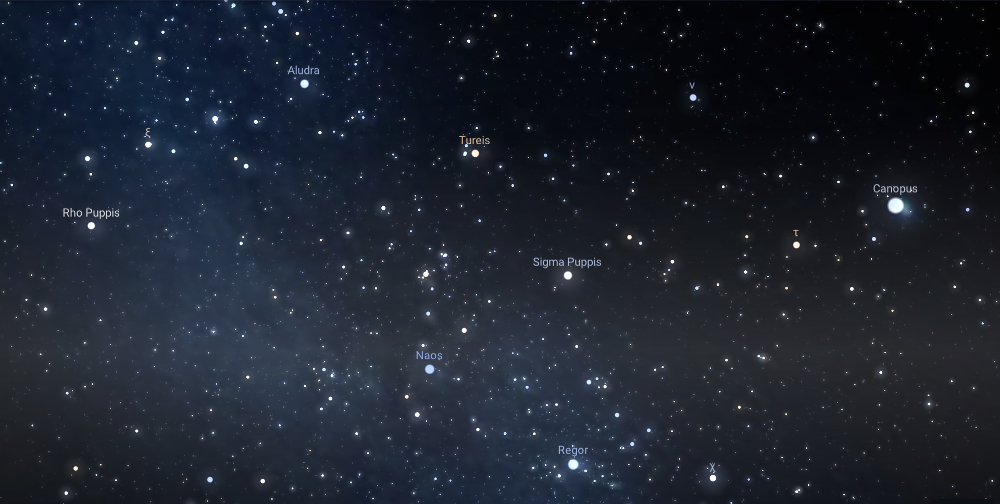

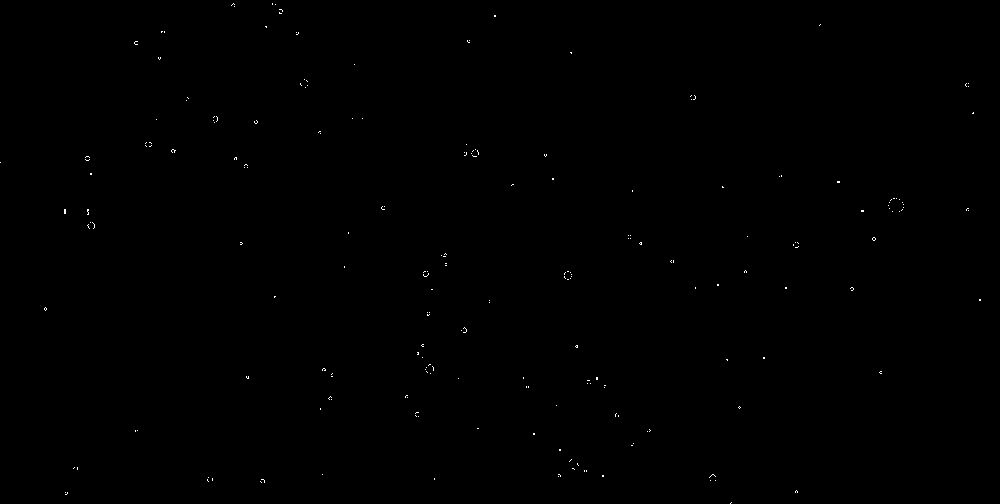

Puppis UrsaMinor


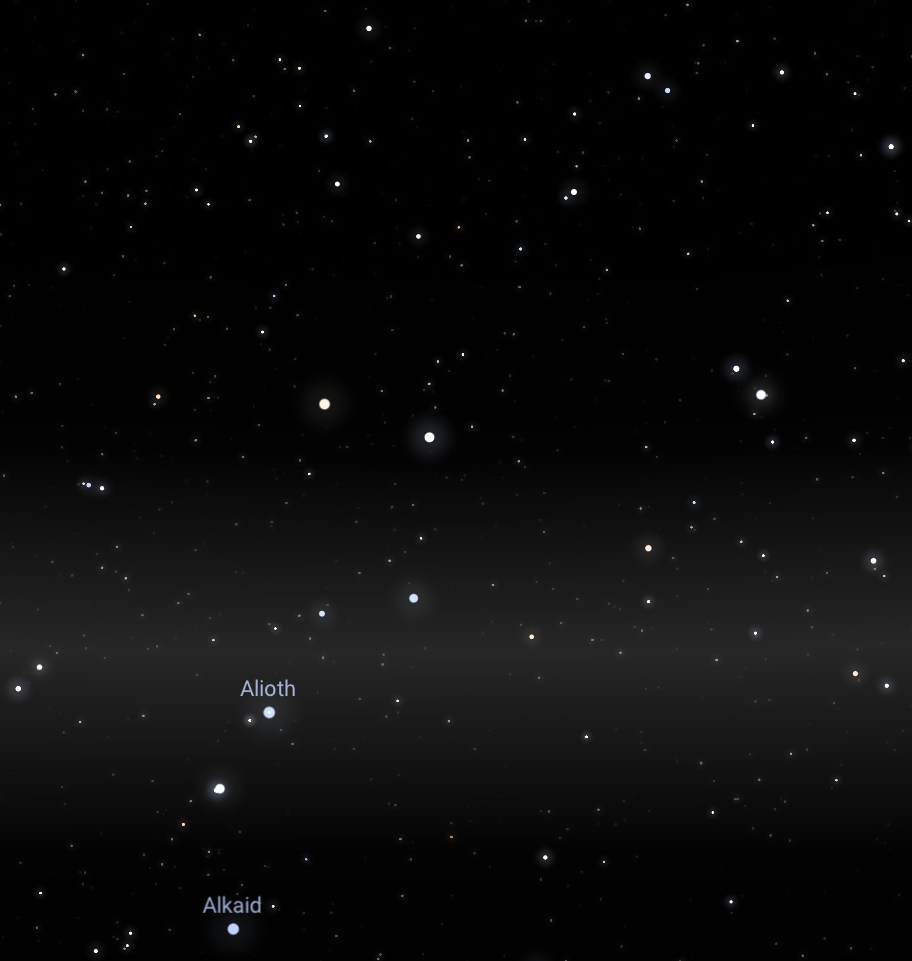

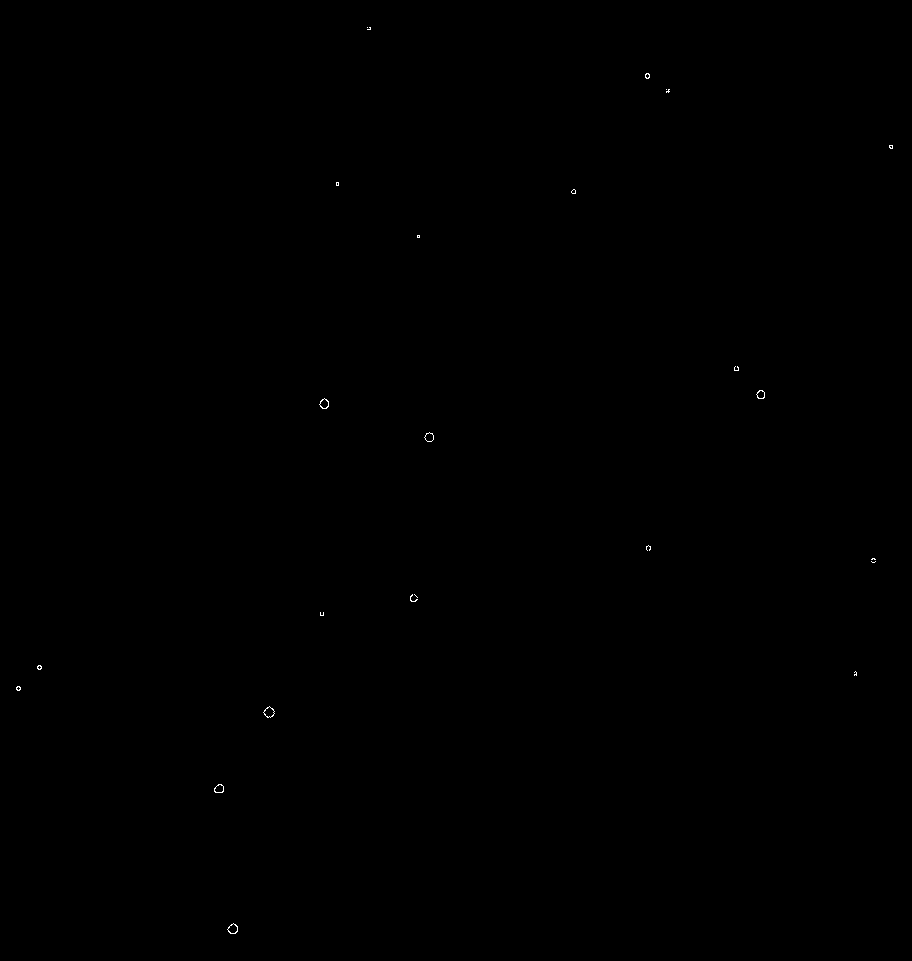

UrsaMajor Puppis


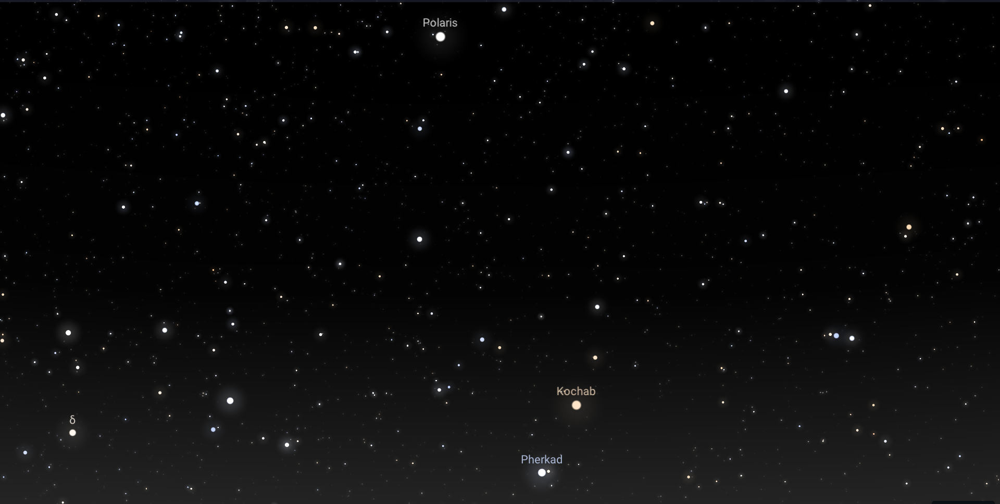

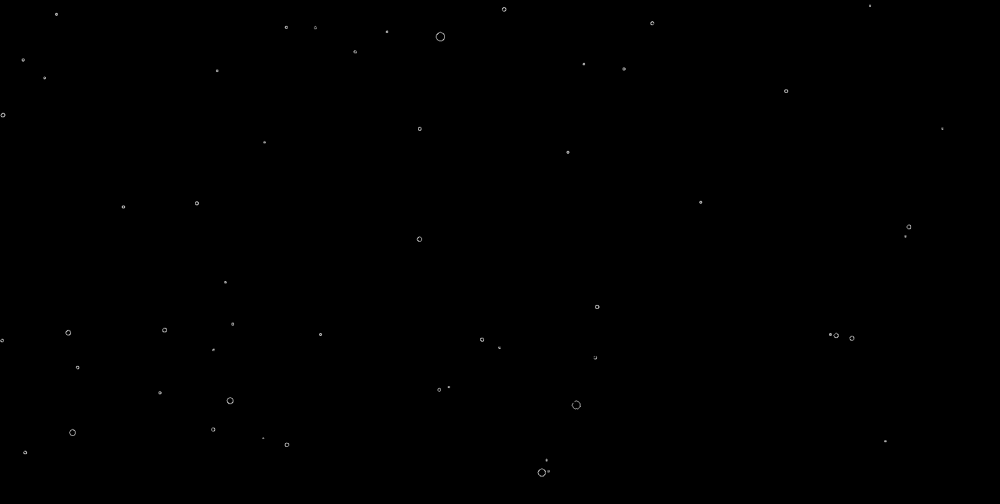

UrsaMinor Phoenix


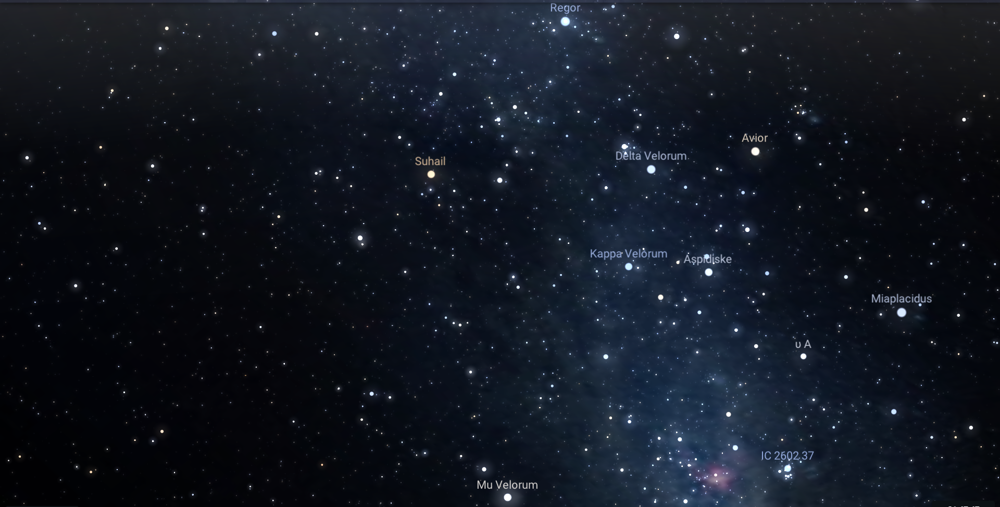

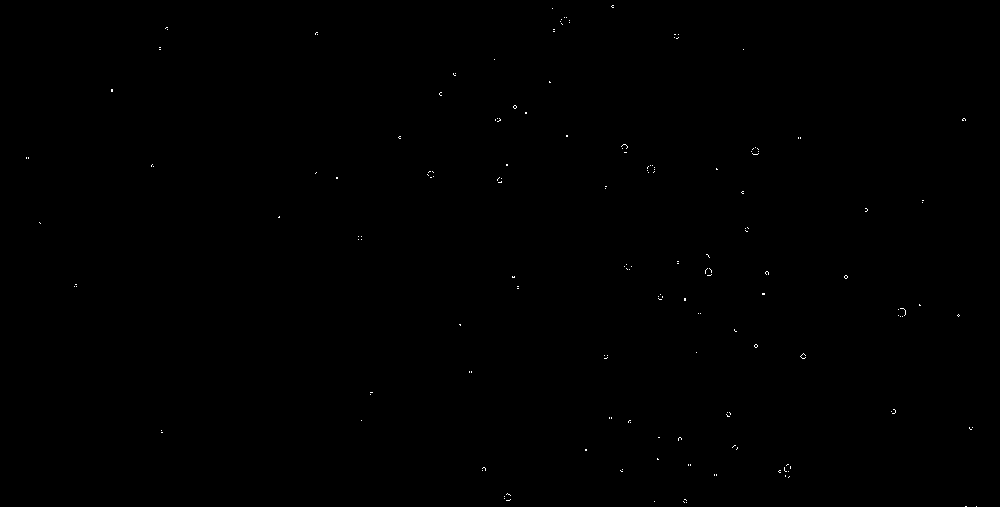

Vela Phoenix
71.0


In [ ]:
from google.colab.patches import cv2_imshow
def test_normaliser(test_path):
    # Process and find the normalised coordinate for each template present in the Templates directory
    # makeTemplates()

    img = cv2.imread(test_path)
    #img = getGrayscale(img)
    cv2_imshow( img)
    cv2.waitKey()

    a = 50

    thresh = binariseImage(img, [190])
    # Subtracting to get only stars
    final = thresh[0]

    #cv2.imwrite("./final.png", final)
    stars = applyMedian(final, 5)
   # cv2_imshow(stars)

   # stars_grey = getGrayscale(stars)
    #final_stars = binariseImage(stars, [70])
    #final_stars_inverted = invertImage(final_stars[0])
    final_stars_inverted = invertImage(stars)
    #cv2_imshow(final_stars[0])

    edged = findEdges(final_stars_inverted, 30, 200)
    cv2_imshow(edged)

    edge_copy = edged.copy()
    contours, hierarchy = cv2.findContours(edge_copy, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

    final_contours = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area != 0:
            final_contours.append(contour)

    # print("Number of Contours found = " + str(len(final_contours)))

    coordinates_list = iterateArea(final_contours, [] , True)
    # print(coordinates_list)

    # plt.figure("Normalised stars")
    # plt.scatter(x, y)
    # plt.show()

    return coordinates_list
    # x, y, _ = iterateArea(final_contours)
	# plt.figure("Normalised stars")
	# plt.scatter(x, y)
	# plt.show()
	# return [(x, y)]

def score(x , y , template_x , template_y) :
	test_coordinates = {}
	template_coordinates = {}

	for i in range(len(x)):
		test_coordinates[x[i]] = y[i]

	for i in range(len(template_x)):
		template_coordinates[template_x[i]] = template_y[i]

	sorted_x = []
	sorted_y = []
	sorted_template_x = []
	sorted_template_y = []

	for i in sorted(test_coordinates.keys()):
		sorted_x.append(i)
		sorted_y.append(test_coordinates[i])

	for i in sorted(template_coordinates.keys()):
		sorted_template_x.append(i)
		sorted_template_y.append(template_coordinates[i])

	# print(sorted_template_x)
	# print(sorted_template_y)
	# print("test")
	# print(sorted_x)
	# print(sorted_y)

	index_test = 0
	index_template = 0

	count = 0
	matched_coord = []

	while index_test < len(sorted_x):
		check_x = sorted_template_x[index_template]
		check_y = sorted_template_y[index_template]

		if sorted_x[index_test] <= check_x + 0.05 and sorted_x[index_test] >= check_x - 0.05 and sorted_y[index_test] <= check_y + 0.05 and sorted_y[index_test] >= check_y - 0.05:
			count += 1
			index_template += 1
			matched_coord.append((sorted_x[index_test], sorted_y[index_test]))

		elif sorted_x[index_test] > check_x:
			index_template += 1

		index_test += 1
	# print(count)
	# print(matched_coord)

	cv2.waitKey()
	cv2.destroyAllWindows()

def simillarity_error(train ,test):
	threshold = 0.05 * 1
	error = 1e-100
	count = 0
	for i in range(train[0].shape[0]) :
		distances = np.sqrt((test[0] - train[0][i]) **2 + (test[1] - train[1][i]) **2)
		min_dist = min(distances)
		if(min_dist < threshold) :
			count += 1
			error += min_dist

	return count , error
from google.colab.patches import cv2_imshow
def test_runner(constellation) :
	test_coordinates = test_normaliser('test_data/' + constellation + '.png')
	true_label = constellation[:]
	# print(len(test_coordinates))

	file = open('Template Coordinates' , 'rb')
	template_coordinate = pickle.load(file)

	score = -1
	pred_label = 'None'

	plot_points = []

	for bright_perm in range(len(test_coordinates)) :
		for constellation in template_coordinate :
			x_template , y_template , n_stars , normalised_lines = template_coordinate[constellation]

			e = simillarity_error((x_template, y_template) , test_coordinates[bright_perm])
			# score(x_test , y_test , x_template , y_template)
			cur_score = e[0] * (e[0]-2) / (n_stars * e[1])
			# cur_score = np.exp(e[0] / n_stars) * (e[0]-2) / e[1]
			# print(constellation , e , n_stars , cur_score)

			if e[0] > 2 and score < cur_score < 1e+3 :
				pred_label = constellation
				score = cur_score


				plot_points = (x_template, y_template, test_coordinates, normalised_lines)

	plt.figure('Matched ' + true_label + " " + pred_label	)
	plt.scatter(plot_points[0], plot_points[1])
	plt.scatter(plot_points[2][bright_perm][0], plot_points[2][bright_perm][1])
	for line in plot_points[3]:
		for x1,y1,x2,y2 in line:
			plt.plot([x1, x2], [y1, y2], color='red')
	plt.savefig("./Predicted_images/" + true_label + " " + pred_label)
	plt.close()


	return pred_label


if __name__ == "__main__":

	d = ['Andromeda' , 'Aquila' , 'Auriga' , 'CanisMajor' , 'Capricornus' , 'Cetus' , 'Columba' , 'Gemini' , 'Grus' , 'Leo' , 'Orion' , 'Pavo' , 'Pegasus' , 'Phoenix' , 'Pisces' , 'PiscisAustrinus' , 'Puppis' , 'UrsaMajor' , 'UrsaMinor' , 'Vela']
	count = 0
	for i in d :
		pred = test_runner(i)
		if (pred == i) :
			count += 1
		else :
			print(i , pred)

	print((count+2 / len(d))*10)
	cv2.waitKey(0)

